In [1]:
# Core libraries
import os
import zipfile
import shutil
import random

# Image processing
import cv2
import matplotlib.pyplot as plt
import albumentations as A

In [2]:
import torch
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))

CUDA available: True
GPU name: NVIDIA A100-SXM4-40GB


In [3]:
!pip install opencv-python matplotlib

In [4]:
!pip install albumentations --quiet

In [5]:
!pip install roboflow --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 104.2 MB/s eta 0:00:00


### Data Preparation

In [6]:
import os
os.listdir("/content")

['.config', 'sample_data']

In [7]:
from roboflow import Roboflow

rf = Roboflow(api_key="ahWY6fipy725RcLzAuIK")   #  insert your API key
project = rf.workspace("machine-learning-class-eiri5").project("intersection-traffic-piimy")
dataset = project.version(10).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Intersection-Traffic--10 in yolov8:: 100%|██████████| 38762/38762 [00:05<00:00, 7551.75it/s]


In [8]:
yaml_text = """
train: /content/Intersection-Traffic--10/train
val: /content/Intersection-Traffic--10/valid
test: /content/Intersection-Traffic--10/test

nc: 5
names:
  0: bicycle
  1: bus
  2: car
  3: license-plate
  4: motorcycle
"""

with open("/content/Intersection-Traffic--10/data1.yaml", "w") as f:
    f.write(yaml_text)

print(" data1.yaml created successfully!")

 data1.yaml created successfully!


#### Train, Valid and Test splits and their counts

In [9]:
for split in ["train", "valid", "test"]:
    print(f"--- {split.upper()} ---")
    print("Images:", len(os.listdir(f"/content/Intersection-Traffic--10/{split}/images")))
    print("Labels:", len(os.listdir(f"/content/Intersection-Traffic--10/{split}/labels")))
    print()

--- TRAIN ---
Images: 17334
Labels: 17334

--- VALID ---
Images: 1321
Labels: 1321

--- TEST ---
Images: 720
Labels: 720



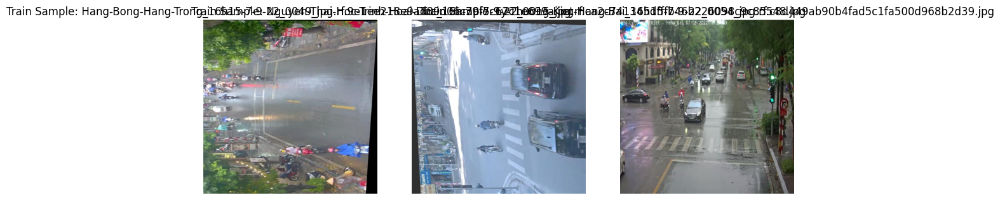

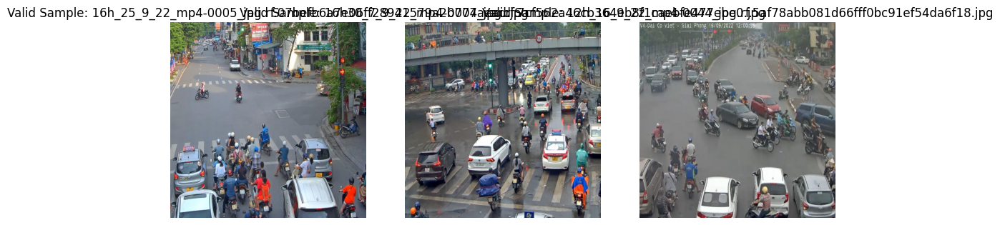

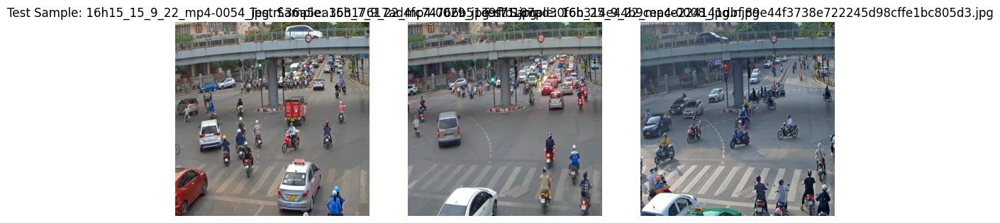

In [10]:
def show_random_images(split_path, title, num_images=3):
    image_dir = os.path.join(split_path, "images")
    image_files = os.listdir(image_dir)
    selected = random.sample(image_files, num_images)

    plt.figure(figsize=(12, 4))
    for i, img_file in enumerate(selected):
        img_path = os.path.join(image_dir, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"{title}: {img_file}")
    plt.show()


# Paths
train_path = "/content/Intersection-Traffic--10/train"
valid_path = "/content/Intersection-Traffic--10/valid"
test_path  = "/content/Intersection-Traffic--10/test"

# Show samples
show_random_images(train_path, "Train Sample")
show_random_images(valid_path, "Valid Sample")
show_random_images(test_path, "Test Sample")

### Image Preprocessing
#### Data Cleaning - Remove corrupted or unreadable images

In [11]:
# Remove Corrupted Images
def find_bad_images(path):
    bad = []
    for f in os.listdir(path):
        img = cv2.imread(os.path.join(path, f))
        if img is None:
            bad.append(f)
    return bad

bad_train = find_bad_images("/content/Intersection-Traffic--10/train/images")
bad_valid = find_bad_images("/content/Intersection-Traffic--10/valid/images")
bad_test  = find_bad_images("/content/Intersection-Traffic--10/test/images")

bad_train, bad_valid, bad_test

([], [], [])

#### Consider a sample subset of train,test and valid datasets

In [21]:
# -----------------------------
# Paths to your existing dataset
# -----------------------------
original_paths = {
    "train": "/content/Intersection-Traffic--10/train",
    "valid": "/content/Intersection-Traffic--10/valid",
    "test": "/content/Intersection-Traffic--10/test"
}

# -----------------------------
# Collect all images into one list
# -----------------------------
all_images = []

for split in original_paths:
    imgs = os.listdir(os.path.join(original_paths[split], "images"))
    imgs = [os.path.join(original_paths[split], "images", f) for f in imgs]
    all_images.extend(imgs)

print("Total images found:", len(all_images))

# -----------------------------
# Sample size (train max = 200)
# -----------------------------
train_size = 10000
total = train_size / 0.70   # train is 70%

valid_size = int(total * 0.15)
test_size = int(total * 0.15)

print("Sampling:")
print("Train:", train_size)
print("Valid:", valid_size)
print("Test :", test_size)

# -----------------------------
# Random sampling
# -----------------------------
random.shuffle(all_images)

train_images = all_images[:train_size]
valid_images = all_images[train_size : train_size + valid_size]
test_images  = all_images[train_size + valid_size : train_size + valid_size + test_size]

# -----------------------------
# Create new dataset folders
# -----------------------------
base = "/content/small_dataset"

for split in ["train", "valid", "test"]:
    os.makedirs(f"{base}/{split}/images", exist_ok=True)
    os.makedirs(f"{base}/{split}/labels", exist_ok=True)

def copy_with_label(img_path, out_split):
    img_name = os.path.basename(img_path)
    lbl_name = img_name.replace(".jpg", ".txt").replace(".png", ".txt")

    # Copy image
    shutil.copy(img_path, f"{base}/{out_split}/images/{img_name}")

    # Copy label from corresponding original folder
    for split in original_paths:
        lbl_path = os.path.join(original_paths[split], "labels", lbl_name)
        if os.path.exists(lbl_path):
            shutil.copy(lbl_path, f"{base}/{out_split}/labels/{lbl_name}")
            return True
    return False

# -----------------------------
# Copy images + labels
# -----------------------------
for img in train_images:
    copy_with_label(img, "train")

for img in valid_images:
    copy_with_label(img, "valid")

for img in test_images:
    copy_with_label(img, "test")

print("\n DONE! Small dataset created at: /content/small_dataset")

Total images found: 19375
Sampling:
Train: 10000
Valid: 2142
Test : 2142

 DONE! Small dataset created at: /content/small_dataset


In [22]:
yaml_text = """
train: /content/small_dataset/train/images
val: /content/small_dataset/valid/images
test: /content/small_dataset/test/images

nc: 5
names:
  0: bicycle
  1: bus
  2: car
  3: license-plate
  4: motorcycle
"""

with open("/content/data2.yaml", "w") as f:
    f.write(yaml_text)

print(" data2.yaml created successfully!")

 data2.yaml created successfully!


#### Show Invalid/missing Labels, Display Image, and Delete Files

YOLO model suffers if there are invalid or missing labels in the image hence cleanup is essential


 Checking labels in: /content/small_dataset/train
 Invalid label files: ['Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.d2073f1164c92375bc2032d7964eb273.txt', 'Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.63e55b3fb009c66fb9ff73d5ec03d5e2.txt', 'Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.80325e2ba3bc08c677df5a72e6f370ed.txt', 'Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.4ffcea0a781490379bad00d870d6c3eb.txt', 'Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.txt', 'Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.d93271471ceab7278e268ff152903048.txt', 'Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.42c944aa95d156037baa6df2db12e348.txt']


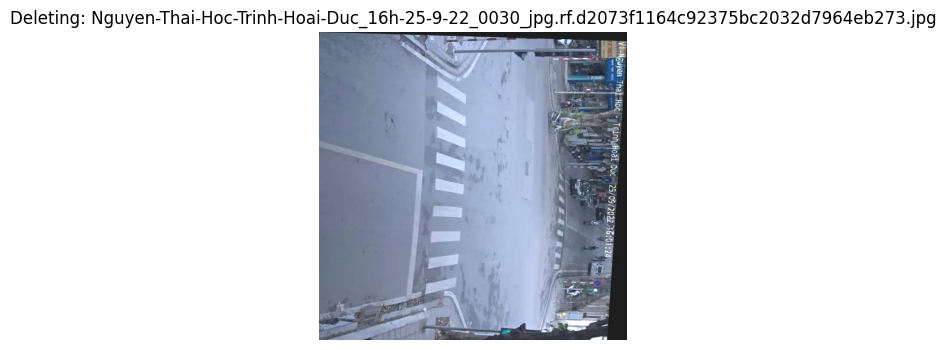

 Deleted image: /content/small_dataset/train/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.d2073f1164c92375bc2032d7964eb273.jpg
 Deleted label: /content/small_dataset/train/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.d2073f1164c92375bc2032d7964eb273.txt


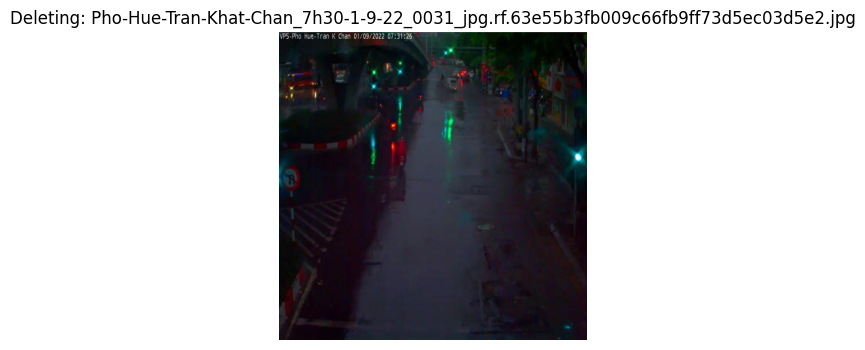

 Deleted image: /content/small_dataset/train/images/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.63e55b3fb009c66fb9ff73d5ec03d5e2.jpg
 Deleted label: /content/small_dataset/train/labels/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.63e55b3fb009c66fb9ff73d5ec03d5e2.txt


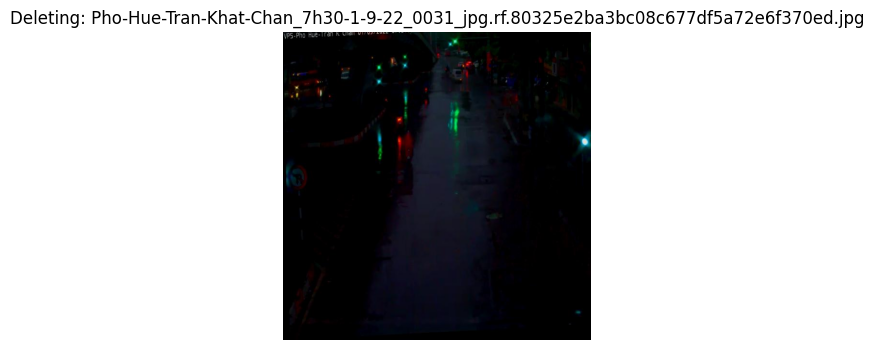

 Deleted image: /content/small_dataset/train/images/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.80325e2ba3bc08c677df5a72e6f370ed.jpg
 Deleted label: /content/small_dataset/train/labels/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.80325e2ba3bc08c677df5a72e6f370ed.txt


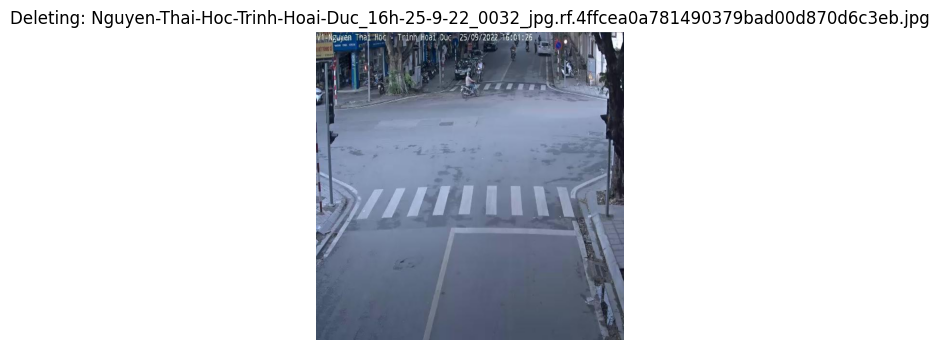

 Deleted image: /content/small_dataset/train/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.4ffcea0a781490379bad00d870d6c3eb.jpg
 Deleted label: /content/small_dataset/train/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.4ffcea0a781490379bad00d870d6c3eb.txt


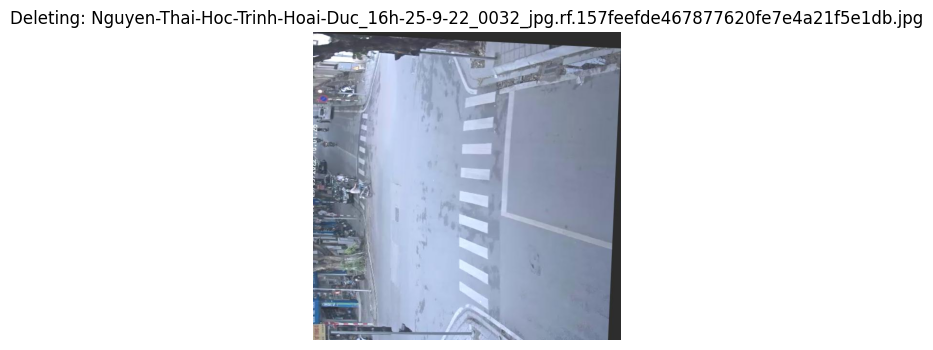

 Deleted image: /content/small_dataset/train/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.jpg
 Deleted label: /content/small_dataset/train/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.txt


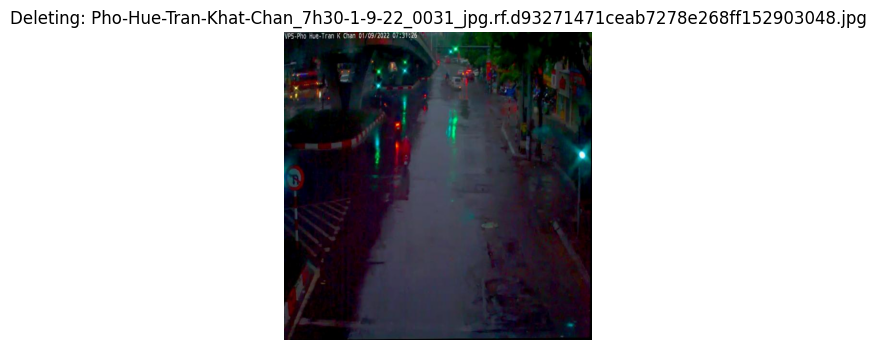

 Deleted image: /content/small_dataset/train/images/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.d93271471ceab7278e268ff152903048.jpg
 Deleted label: /content/small_dataset/train/labels/Pho-Hue-Tran-Khat-Chan_7h30-1-9-22_0031_jpg.rf.d93271471ceab7278e268ff152903048.txt


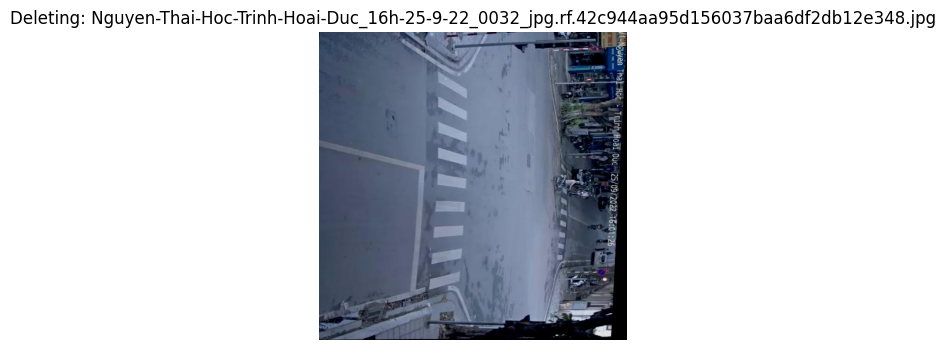

 Deleted image: /content/small_dataset/train/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.42c944aa95d156037baa6df2db12e348.jpg
 Deleted label: /content/small_dataset/train/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.42c944aa95d156037baa6df2db12e348.txt
 Cleanup complete for: /content/small_dataset/train

 Checking labels in: /content/small_dataset/valid
 Invalid label files: ['Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.1115afa5ed31437c2f2a6add3e08e008.txt']


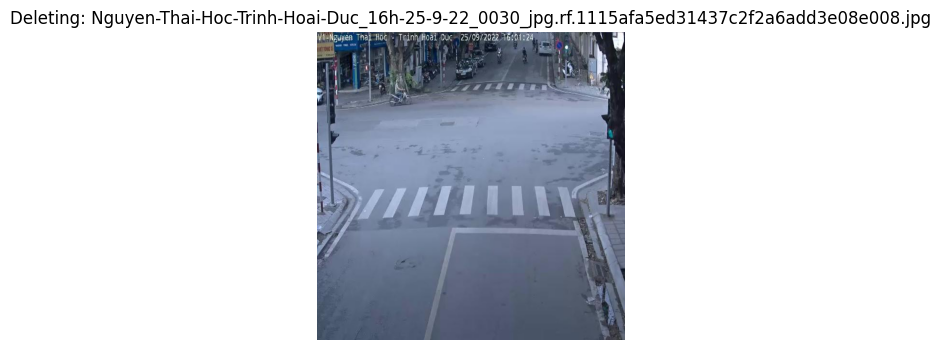

 Deleted image: /content/small_dataset/valid/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.1115afa5ed31437c2f2a6add3e08e008.jpg
 Deleted label: /content/small_dataset/valid/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0030_jpg.rf.1115afa5ed31437c2f2a6add3e08e008.txt
 Cleanup complete for: /content/small_dataset/valid

 Checking labels in: /content/small_dataset/test
 Invalid label files: ['Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.txt']


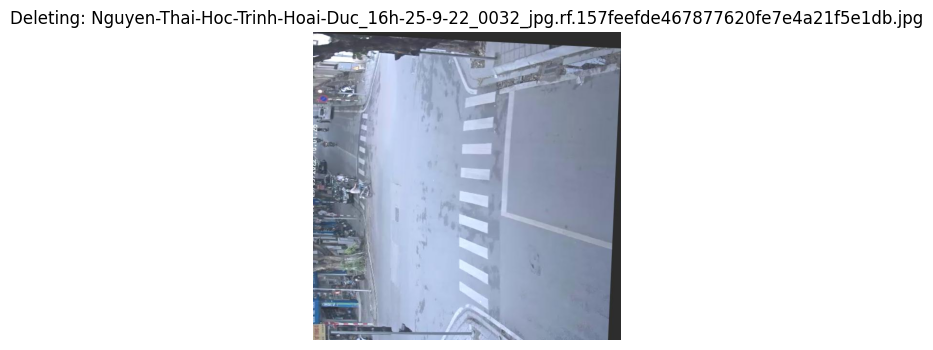

 Deleted image: /content/small_dataset/test/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.jpg
 Deleted label: /content/small_dataset/test/labels/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h-25-9-22_0032_jpg.rf.157feefde467877620fe7e4a21f5e1db.txt
 Cleanup complete for: /content/small_dataset/test


In [23]:
def check_label_file(path):
    """Returns False if label file contains invalid YOLO bounding boxes."""
    try:
        with open(path) as f:
            lines = f.read().strip().split("\n")

        for l in lines:
            parts = l.split()
            if len(parts) != 5:
                return False

            cls, x, y, w, h = map(float, parts)
            if not (0 <= x <= 1 and 0 <= y <= 1 and w > 0 and h > 0):
                return False

    except:
        return False

    return True


# --------------------------------------------------------------
# Function to clean a dataset split (train, valid, test)
# --------------------------------------------------------------
def clean_split(split_path):
    label_dir = f"{split_path}/labels"
    image_dir = f"{split_path}/images"

    invalid = []

    print(f"\n Checking labels in: {split_path}")

    # Find invalid labels
    for f in os.listdir(label_dir):
        lbl_path = os.path.join(label_dir, f)
        if not check_label_file(lbl_path):
            invalid.append(f)

    print(" Invalid label files:", invalid)

    # Display and delete invalid images + labels
    for lbl_file in invalid:
        # Match image name (.jpg or .png)
        img_base = lbl_file.replace(".txt", "")
        img_jpg = os.path.join(image_dir, img_base + ".jpg")
        img_png = os.path.join(image_dir, img_base + ".png")

        img_path = img_jpg if os.path.exists(img_jpg) else img_png
        lbl_path = os.path.join(label_dir, lbl_file)

        # Display image if present
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(4,4))
            plt.imshow(img)
            plt.title(f"Deleting: {os.path.basename(img_path)}")
            plt.axis("off")
            plt.show()

        # Delete image
        if os.path.exists(img_path):
            os.remove(img_path)
            print(f" Deleted image: {img_path}")

        # Delete label
        if os.path.exists(lbl_path):
            os.remove(lbl_path)
            print(f" Deleted label: {lbl_path}")

    print(" Cleanup complete for:", split_path)


# --------------------------------------------------------------
# Run cleaning for all dataset splits
# --------------------------------------------------------------

base = "/content/small_dataset"

for split in ["train", "valid", "test"]:
    clean_split(f"{base}/{split}")

#### Finding Class Imbalance

In [24]:
import os
from collections import Counter

counter = Counter()

for split in ["train", "valid", "test"]:
    label_dir = f"/content/small_dataset/{split}/labels"
    for f in os.listdir(label_dir):
        with open(f"{label_dir}/{f}") as lbl:
            for line in lbl:
                cls = int(line.split()[0])
                counter[cls] += 1

counter

Counter({1: 4154, 4: 222889, 2: 71596, 0: 2580, 3: 1209})

There is a huge imabalnce in the vehicle class types.

#### Visualize Train Image + Labels + Bounding Boxes

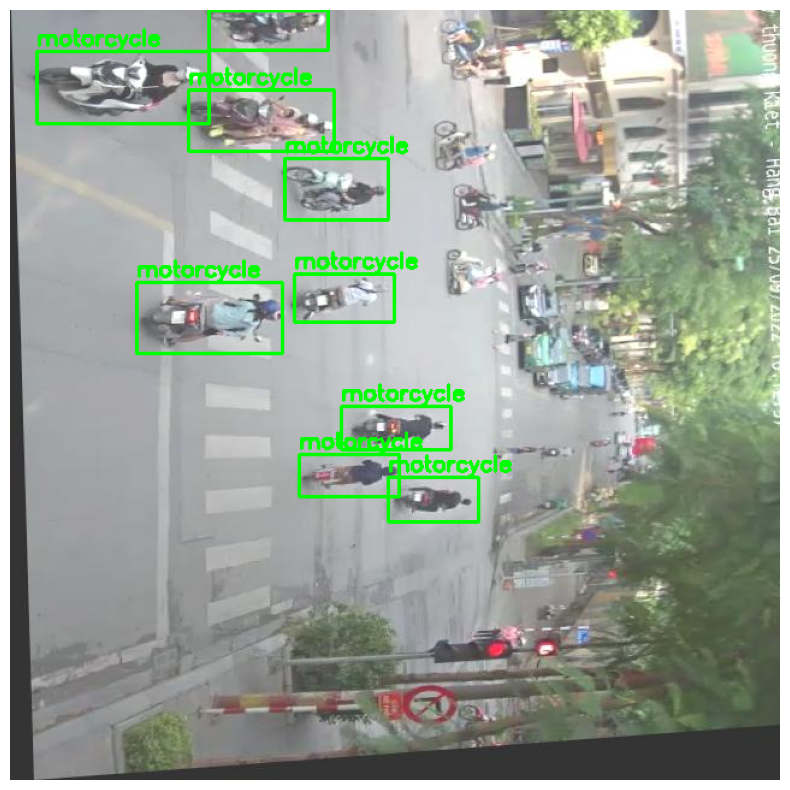

In [25]:
def show_with_labels(image_path, label_path, class_names):
    img = cv2.imread(image_path)

    # Fix rotation issues by forcing numpy array orientation
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w = img.shape[:2]

    with open(label_path, "r") as f:
        lines = f.read().strip().split("\n")

    for line in lines:
        cls, x, y, bw, bh = map(float, line.split())
        cls = int(cls)

        # Convert YOLO to pixel coords
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        # Draw bounding boxes
        cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)

        # Add label text
        label = class_names[cls]
        cv2.putText(img, label, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# directories
img_dir = "/content/small_dataset/train/images"
lbl_dir = "/content/small_dataset/train/labels"

# class names
class_names = {0: "bicycle", 1: "bus", 2: "car", 3: "license-plate", 4: "motorcycle"}

# choose a random image
img_file = random.choice(os.listdir(img_dir))
image_path = os.path.join(img_dir, img_file)
label_path = os.path.join(lbl_dir, img_file.replace(".jpg", ".txt"))

show_with_labels(image_path, label_path, class_names)

 Showing: 16h_15_9_22_mp4-0005_jpg.rf.adba86a6eaa06005bb336cf706d1c251.jpg


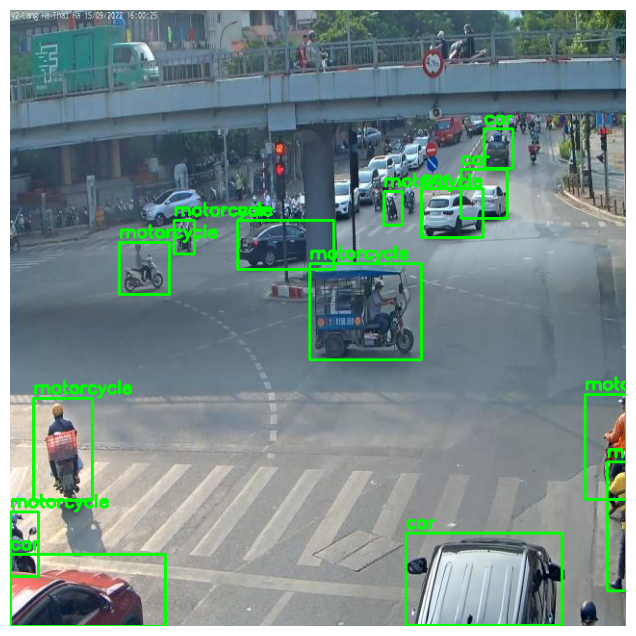

In [26]:
# Paths
img_dir = "/content/small_dataset/train/images"
lbl_dir = "/content/small_dataset/train/labels"

# Class names (update if needed)
class_names = {
    0: "bicycle",
    1: "bus",
    2: "car",
    3: "license-plate",
    4: "motorcycle"
}

def load_and_show_yolo_image(img_path, lbl_path):
    """Draw YOLO bounding boxes on image."""

    # Read image
    img = cv2.imread(img_path)
    h, w = img.shape[:2]

    # Read label file
    with open(lbl_path, "r") as f:
        lines = f.read().strip().split("\n")

    # Draw each bounding box
    for line in lines:
        cls, x, y, bw, bh = map(float, line.split())
        cls = int(cls)

        # Convert YOLO normalized bbox → pixel coordinates
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        # Draw box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Put label
        label = class_names.get(cls, f"class {cls}")
        cv2.putText(img, label, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Convert BGR → RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()


# Pick a random image
img_files = os.listdir(img_dir)
random_img = random.choice(img_files)

img_path = os.path.join(img_dir, random_img)
lbl_path = os.path.join(lbl_dir, random_img.replace(".jpg", ".txt").replace(".png", ".txt"))

print(" Showing:", random_img)
load_and_show_yolo_image(img_path, lbl_path)

#### Verify matching image/label pairs

In [27]:
img_names = set([f.split('.')[0] for f in os.listdir(img_dir)])
lbl_names = set([f.split('.')[0] for f in os.listdir(lbl_dir)])

print("Missing labels:", img_names - lbl_names)
print("Missing images:", lbl_names - img_names)

Missing labels: set()
Missing images: set()


####  Resize images to consistent dimensions 1280*720

In [28]:
# ----------------------------
# CONFIG
# ----------------------------
DATASET_BASE = "/content/small_dataset"
RESIZE_TO = (1280, 720)   # (width, height)

def resize_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        print(" Cannot read file:", img_path)
        return
    resized = cv2.resize(img, RESIZE_TO)
    cv2.imwrite(img_path, resized)

def resize_split(split_name):
    split_path = f"{DATASET_BASE}/{split_name}/images"
    files = os.listdir(split_path)

    print(f"\n Resizing {split_name} — {len(files)} images")

    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            resize_image(os.path.join(split_path, file))

    print(f" Done resizing: {split_name}")

# Run resizing for all splits
for split in ["train", "valid", "test"]:
    resize_split(split)

print("\n All images resized successfully!")


 Resizing train — 12977 images
 Done resizing: train

 Resizing valid — 3339 images
 Done resizing: valid

 Resizing test — 3353 images
 Done resizing: test

 All images resized successfully!


#### Enhance Contrast (CLAHE) on Train Only for smaller vehicles better visbility

In [30]:
TRAIN_IMAGES = "/content/small_dataset/train/images"

def enhance_contrast_clahe(image):
    """Contrast enhancement using CLAHE (LAB space)."""
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    L, A, B = cv2.split(lab)

    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    L2 = clahe.apply(L)

    lab = cv2.merge((L2, A, B))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

def enhance_train_dataset():
    files = os.listdir(TRAIN_IMAGES)
    print(f"\n Enhancing contrast for TRAIN — {len(files)} images")

    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            img_path = os.path.join(TRAIN_IMAGES, file)
            img = cv2.imread(img_path)
            if img is None:
                print(" Unable to load:", img_path)
                continue

            enhanced = enhance_contrast_clahe(img)
            cv2.imwrite(img_path, enhanced)

    print(" Contrast enhancement complete for TRAIN dataset!")

# Run enhancement
enhance_train_dataset()

print("\n CLAHE enhancement applied to TRAIN dataset only!")


 Enhancing contrast for TRAIN — 12977 images
 Contrast enhancement complete for TRAIN dataset!

 CLAHE enhancement applied to TRAIN dataset only!


 Showing: Nguyen-Thai-Hoc-Ton-Duc-Thang_16h-25-9-22_0002_jpg.rf.14213561d23595778adb0c48a9110a74.jpg


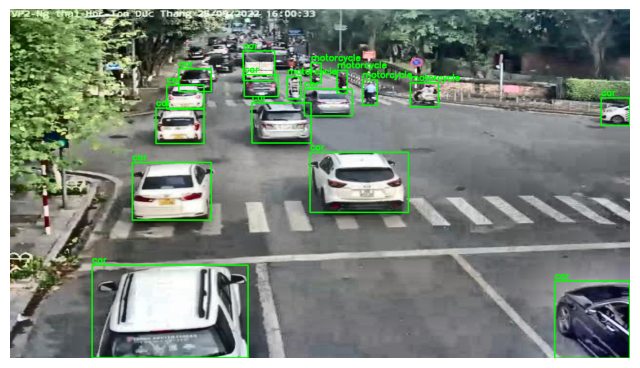

In [32]:
# Pick a random image
img_files = os.listdir(img_dir)
random_img = random.choice(img_files)

img_path = os.path.join(img_dir, random_img)
lbl_path = os.path.join(lbl_dir, random_img.replace(".jpg", ".txt").replace(".png", ".txt"))

print(" Showing:", random_img)
load_and_show_yolo_image(img_path, lbl_path)

#### TILING (2*2 splits) improves detection of far and small vehicles by making them larger in tiled images on train dataset

In [ ]:


OUTPUT_IMG = "/content/small_dataset/train_tiled/images"
OUTPUT_LBL = "/content/small_dataset/train_tiled/labels"

os.makedirs(OUTPUT_IMG, exist_ok=True)
os.makedirs(OUTPUT_LBL, exist_ok=True)

print("Running tiling on TRAIN dataset...")

for file in os.listdir(TRAIN_IMG):
    if not file.lower().endswith((".jpg", ".png")):
        continue

    img_path = os.path.join(TRAIN_IMG, file)
    lbl_path = os.path.join(TRAIN_LBL, file.replace(".jpg", ".txt").replace(".png", ".txt"))

    img = cv2.imread(img_path)
    h, w = img.shape[:2]

    half_h = h // 2
    half_w = w // 2

    tiles = [
        (0, 0, half_w, half_h),          # top left
        (half_w, 0, w, half_h),          # top right
        (0, half_h, half_w, h),          # bottom left
        (half_w, half_h, w, h)           # bottom right
    ]

    # Load YOLO labels
    if os.path.exists(lbl_path):
        with open(lbl_path) as f:
            labels = f.read().strip().split("\n")
    else:
        labels = []

    for idx, (x1, y1, x2, y2) in enumerate(tiles):
        tile = img[y1:y2, x1:x2]
        tile_h, tile_w = tile.shape[:2]
        new_labels = []

        for line in labels:
            cls, xc, yc, bw, bh = map(float, line.split())

            abs_x = xc * w
            abs_y = yc * h

            # If object center lies inside the tile
            if x1 <= abs_x <= x2 and y1 <= abs_y <= y2:
                new_x = (abs_x - x1) / tile_w
                new_y = (abs_y - y1) / tile_h
                new_w = bw * w / tile_w
                new_h = bh * h / tile_h

                new_labels.append(f"{int(cls)} {new_x} {new_y} {new_w} {new_h}")

        new_img_file = f"{file.replace('.jpg','').replace('.png','')}_tile{idx}.jpg"
        new_lbl_file = new_img_file.replace(".jpg", ".txt")

        cv2.imwrite(os.path.join(OUTPUT_IMG, new_img_file), tile)

        with open(os.path.join(OUTPUT_LBL, new_lbl_file), "w") as f:
            f.write("\n".join(new_labels))

print("\n TRAIN tiling completed! Output → /content/small_dataset/train_tiled/")

Running tiling on TRAIN dataset...

 TRAIN tiling completed! Output → /content/small_dataset/train_tiled/


#### Oversample BICYCLE (0) *5 and BUS (1) *3

In [33]:
# -------------------------------
# oversample configuration
# -------------------------------
# class 0 = bicycle --> duplicate x5
# class 1 = bus     --> duplicate x3
oversample = {0: 5, 1: 3}

TRAIN_IMG = "/content/small_dataset/train/images"
TRAIN_LBL = "/content/small_dataset/train/labels"

print(" Oversampling rare classes in TRAIN_TILED...")

for lbl_file in os.listdir(TRAIN_LBL):
    lbl_path = os.path.join(TRAIN_LBL, lbl_file)
    base = lbl_file.replace(".txt", "")

    # Find original image (jpg or png)
    img_path = os.path.join(TRAIN_IMG, base + ".jpg")
    if not os.path.exists(img_path):
        img_path = os.path.join(TRAIN_IMG, base + ".png")
    if not os.path.exists(img_path):
        print(" Missing corresponding image for:", lbl_file)
        continue

    # Determine which classes appear in this label file
    classes_in_file = set()
    with open(lbl_path) as f:
        for line in f:
            cls = int(line.split()[0])
            classes_in_file.add(cls)

    # Apply oversampling
    for cls, count in oversample.items():
        if cls in classes_in_file:
            for i in range(count - 1):  # -1 because original is already present
                new_img = os.path.join(TRAIN_IMG, f"{base}_dup{i}.jpg")
                new_lbl = os.path.join(TRAIN_LBL, f"{base}_dup{i}.txt")

                shutil.copy(img_path, new_img)
                shutil.copy(lbl_path, new_lbl)

print("\n Oversampling complete for TRAIN_TILED dataset!")

 Oversampling rare classes in TRAIN_TILED...

 Oversampling complete for TRAIN_TILED dataset!


#### Albumentations Weather Augmentation (TRAIN ONLY)

In [ ]:
augment = A.Compose([
    A.OneOf([
        A.RandomRain(),
        A.RandomFog(),
        A.MotionBlur(),
    ], p=0.6),
    A.RandomBrightnessContrast(p=0.4),
    A.CLAHE(p=0.25)
])

print(" Applying weather + blur + brightness augmentations to TRAIN...")

for file in os.listdir(TRAIN_IMG):
    if not file.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    path = os.path.join(TRAIN_IMG, file)
    img = cv2.imread(path)
    if img is None:
        continue

    augmented = augment(image=img)["image"]
    cv2.imwrite(path, augmented)

print("\n Weather augmentations applied to TRAIN dataset only!")

 Applying weather + blur + brightness augmentations to TRAIN...

 Weather augmentations applied to TRAIN dataset only!


 Showing: Le-Duan-Nguyen-Thai-Hoc_16h-15-9-22_0008_jpg.rf.2afce6b071d67a4bac1b25bc0ef88fae.jpg


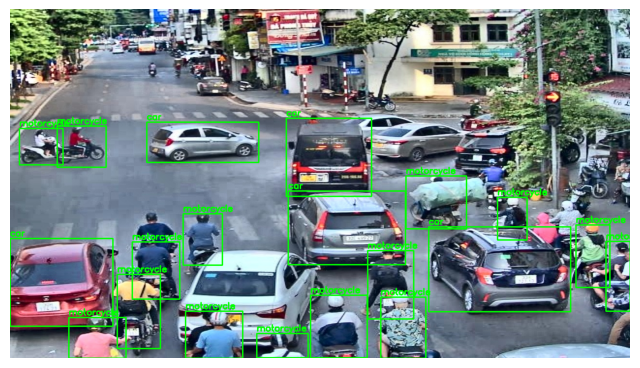

In [35]:
# Pick a random image to visualize

img_dir = "/content/small_dataset/train/images"
lbl_dir = "/content/small_dataset/train/labels"

img_files = os.listdir(img_dir)
random_img = random.choice(img_files)

img_path = os.path.join(img_dir, random_img)
lbl_path = os.path.join(lbl_dir, random_img.replace(".jpg", ".txt").replace(".png", ".txt"))

print(" Showing:", random_img)
load_and_show_yolo_image(img_path, lbl_path)

#### Removing uneccessary class which is license plate on all splits as part of this project

In [ ]:
# import os

# DATASET_BASE = "/content/small_dataset"

# REMOVE_CLASS = 3        # license-plate
# REMAP_CLASS_OLD = 4     # old motorcycle label
# REMAP_CLASS_NEW = 3     # new motorcycle label

# def clean_and_remap(split):
#     lbl_dir = f"{DATASET_BASE}/{split}/labels"
#     img_dir = f"{DATASET_BASE}/{split}/images"

#     print(f"\n Cleaning & remapping labels in: {split}")

#     for lbl_file in os.listdir(lbl_dir):
#         lbl_path = os.path.join(lbl_dir, lbl_file)
#         base = lbl_file.replace(".txt", "")

#         img_path = None
#         for ext in [".jpg", ".png", ".jpeg"]:
#             candidate = os.path.join(img_dir, base + ext)
#             if os.path.exists(candidate):
#                 img_path = candidate
#                 break

#         with open(lbl_path, "r") as f:
#             lines = f.read().strip().split("\n")

#         new_lines = []

#         for line in lines:
#             if not line.strip():
#                 continue

#             parts = line.split()
#             if len(parts) < 5:
#                 continue

#             cls = int(parts[0])

#             if cls == REMOVE_CLASS:
#                 continue   # remove license-plate

#             # remap motorcycle 4 ---> 3
#             if cls == REMAP_CLASS_OLD:
#                 cls = REMAP_CLASS_NEW
#                 parts[0] = str(cls)
#                 line = " ".join(parts)

#             new_lines.append(line)

#         # delete image + label if empty
#         if len(new_lines) == 0:
#             print(f" Deleted empty {base}")
#             os.remove(lbl_path)
#             if img_path:
#                 os.remove(img_path)
#             continue

#         # write fixed labels
#         with open(lbl_path, "w") as f:
#             f.write("\n".join(new_lines))

#     print(f" Finished: {split}")

# # RUN FOR ALL SPLITS
# for split in ["train_tiled", "valid", "test"]:
#     clean_and_remap(split)

# print("\n All datasets cleaned & remapped successfully!")

In [ ]:
# yaml_text = """
# train: /content/small_dataset/train_tiled/images
# val: /content/small_dataset/valid/images
# test: /content/small_dataset/test/images

# nc: 5
# names:
#   0: bicycle
#   1: bus
#   2: car
#   3: motorcycle
#   4: license-plate
# """

# with open("/content/data_small.yaml", "w") as f:
#     f.write(yaml_text)

# print(" Updated YAML saved as data_small.yaml")

 Updated YAML saved as data_small.yaml


### Model Training

In [36]:
!pip install ultralytics --quiet
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 62.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [37]:
model = YOLO("yolov8l.pt")   # pretrained COCO model

In [38]:
# Train
results = model.train(
    data="/content/data2.yaml",   # updated YAML
    imgsz=1024,                        # high resolution for distant vehicles
    epochs=20,
    batch=8,
    optimizer="AdamW",
    lr0=0.001,                         # starting learning rate
    lrf=0.01,                          # final learning rate
    augment=True,
    copy_paste=False,
    dropout=0.0,
    weight_decay=0.0005,
    patience=20,

    # Augmentations
    hsv_s=0.6,
    hsv_v=0.6,
    degrees=5,
    translate=0.1,
    scale=0.5,
    shear=2,
    mosaic=0.7,                        # YOLO’s special augmentation
    mixup=0.0,

    # Small-object improvements
    close_mosaic=10,
    max_det=200,
    box=7.0,
    cls=1.0,
    dfl=1.0,

    device=0,                          # GPU
)

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.0, cache=False, cfg=None, classes=None, close_mosaic=10, cls=1.0, compile=False, conf=None, copy_paste=False, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data2.yaml, degrees=5, deterministic=True, device=0, dfl=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.6, hsv_v=0.6, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=200, mixup=0.0, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=0.7, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose=

In [39]:
from ultralytics import YOLO

model_yolo8 = YOLO("runs/detect/train/weights/best.pt")

In [46]:
model_yolo8.save("best_saved.pt")

Latest run folder: /content/runs/detect/train/
Best model: /content/runs/detect/train/weights/best.pt

 Training Curves (results.png)


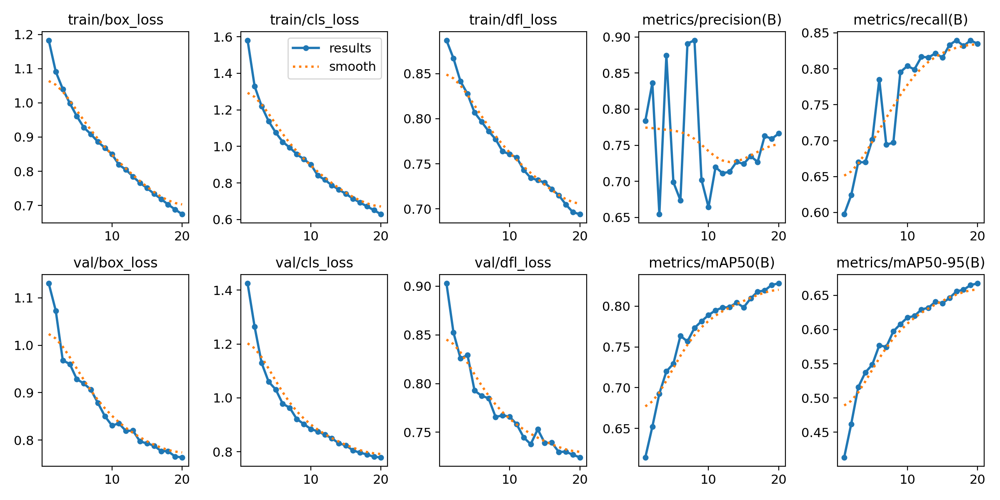


 Confusion Matrix


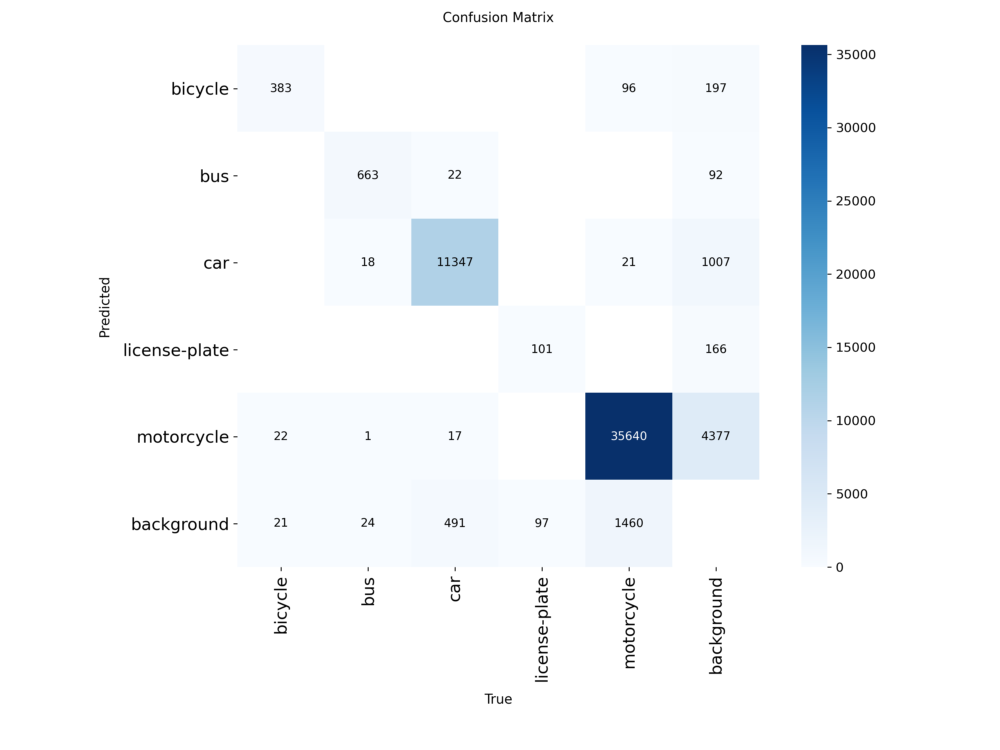


 PR Curve


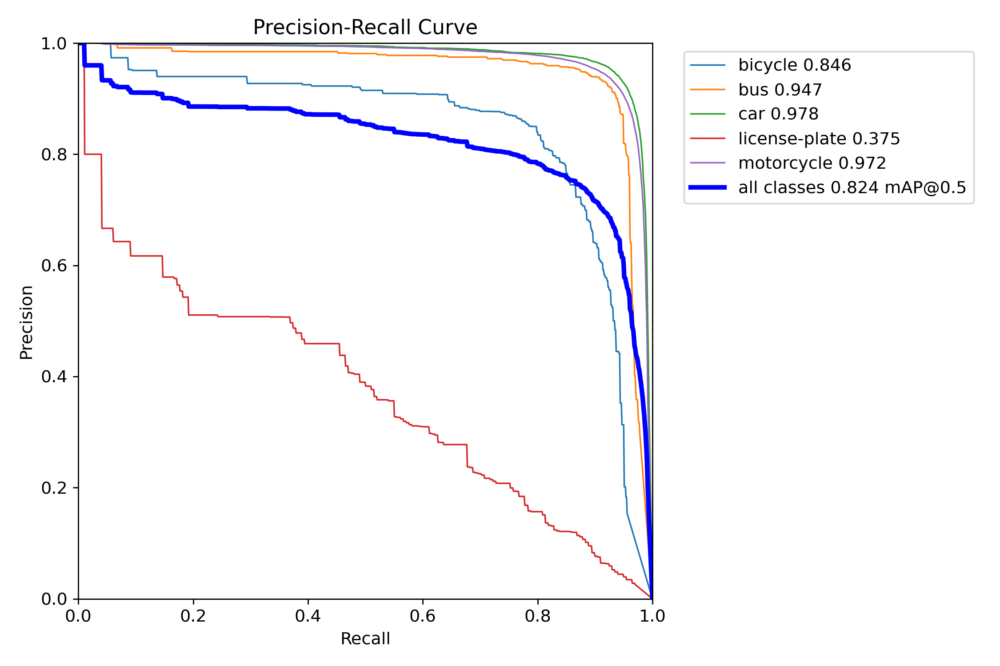


 F1 Curve


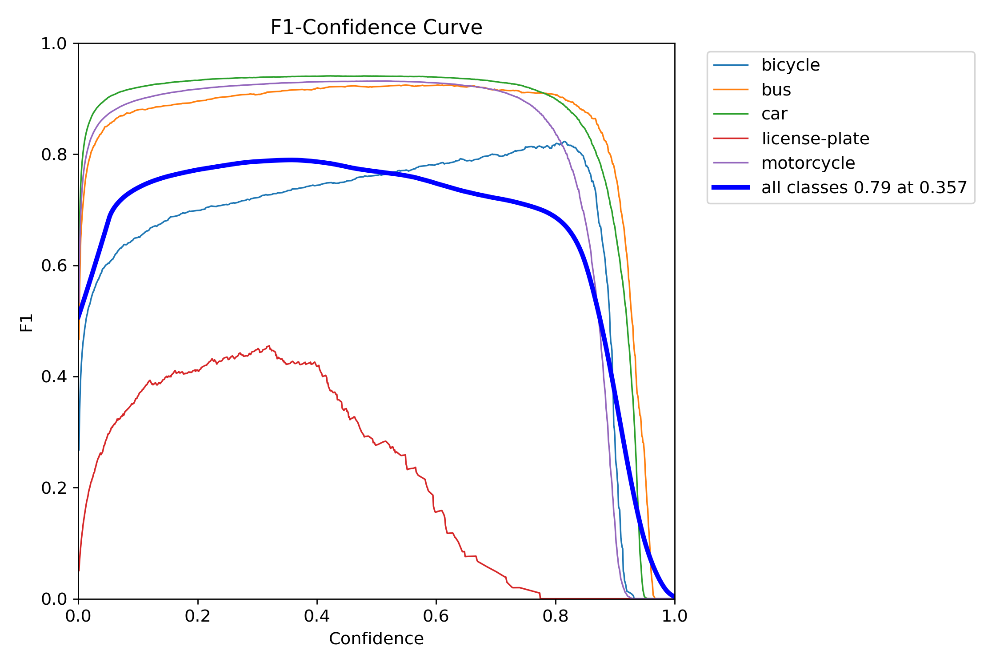

In [41]:
# Load Best Model
from ultralytics import YOLO
import glob

# Find latest training run automatically
run_folders = sorted(glob.glob('/content/runs/detect/train*/'),
                     key=lambda x: int(''.join(filter(str.isdigit, x)) or 0))
latest_run = run_folders[-1]
print("Latest run folder:", latest_run)

best_model_path = latest_run + "weights/best.pt"
print("Best model:", best_model_path)

# Load the best model
model = YOLO(best_model_path)


# Show training curves & confusion matrix =====
from IPython.display import Image, display

print("\n Training Curves (results.png)")
display(Image(filename=latest_run + "results.png"))

print("\n Confusion Matrix")
display(Image(filename=latest_run + "confusion_matrix.png"))

print("\n PR Curve")
display(Image(filename=latest_run + "BoxPR_curve.png"))

print("\n F1 Curve")
display(Image(filename=latest_run + "BoxF1_curve.png"))


# ===== STEP 3: Optional prediction test =====
# results = model.predict("/content/sample.jpg", conf=0.40)
# results[0].plot()

In [42]:
results_test = model_yolo8.val(
    data="/content/data2.yaml",
    split="test"    # VERY IMPORTANT
)

Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 112 layers, 43,610,463 parameters, 0 gradients, 164.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2575.1±865.4 MB/s, size: 222.0 KB)
val: Scanning /content/small_dataset/test/labels... 3353 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 3353/3353 1.4Kit/s 2.4s
val: /content/small_dataset/test/images/Cua-Nam-Dien-Bien-Phu_16h15-25-9-22_0014_jpg.rf.65499ab2b283d4acd4d33b890f18cf8a.jpg: 1 duplicate labels removed
val: /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h-30-15-9-22_0039_jpg.rf.66fe9c58725f03894b022c2dca366b3d.jpg: 1 duplicate labels removed
val: /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h-30-15-9-22_0039_jpg.rf.7bfadd6c3a2e80182280a42de5b785db.jpg: 1 duplicate labels removed
val: /content/small_dataset/test/images/Ly-Thuong-Kiet-Ba-Trieu_16h-15-9-22_0002_jpg.rf.5b8f23253a0342e31b8d8d7484cb89a6.jpg: 1 duplicate labels remove

Latest run folder: /content/runs/detect/val/

 Confusion Matrix


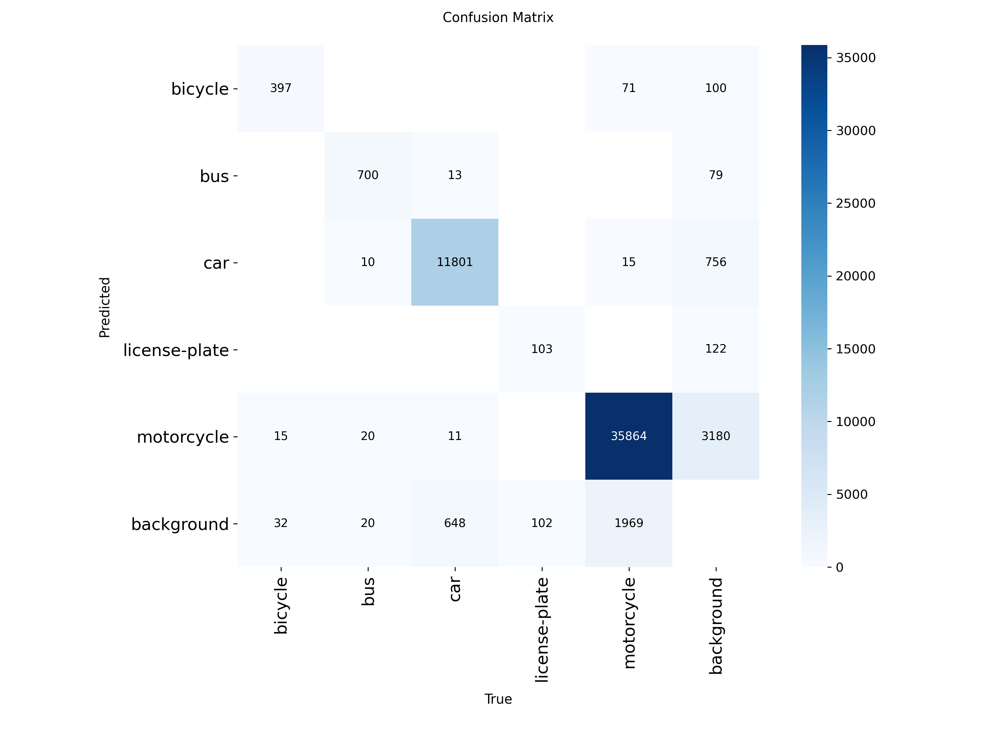


 PR Curve


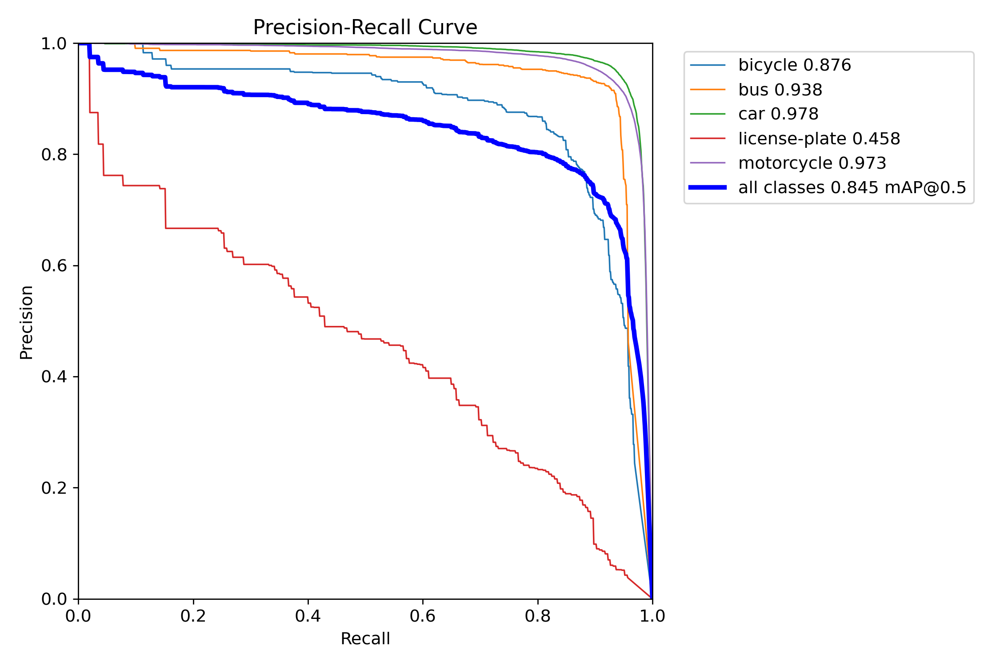


 F1 Curve


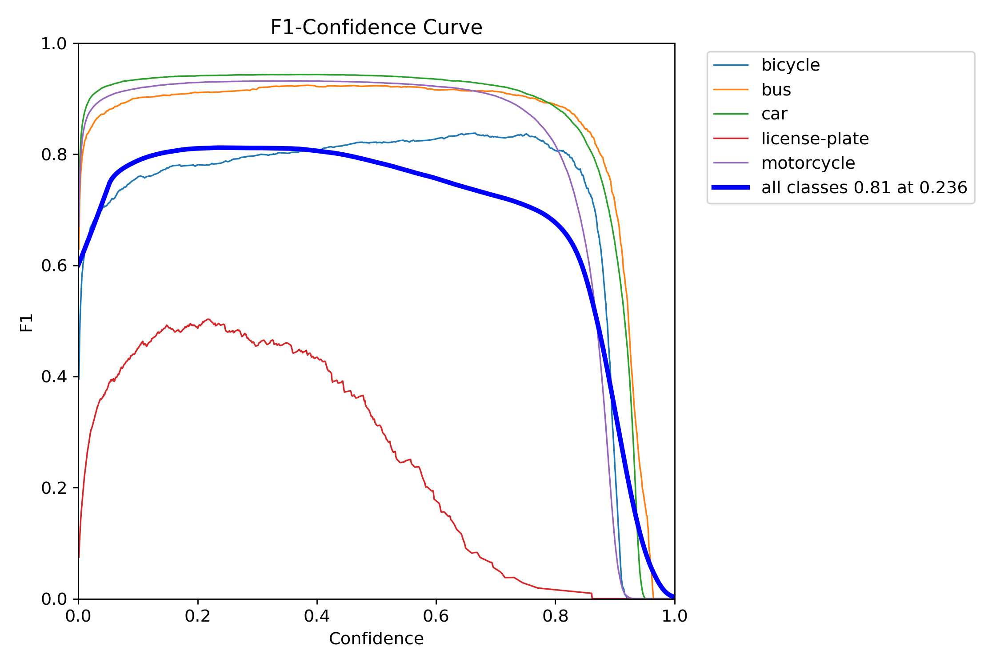

In [45]:
# Load Best Model
from ultralytics import YOLO
import glob

# Find latest training run automatically
run_folders = sorted(glob.glob('/content/runs/detect/val*/'),
                     key=lambda x: int(''.join(filter(str.isdigit, x)) or 0))
latest_run = run_folders[-1]
print("Latest run folder:", latest_run)


# Show training curves & confusion matrix =====
from IPython.display import Image, display


print("\n Confusion Matrix")
display(Image(filename=latest_run + "confusion_matrix.png"))

print("\n PR Curve")
display(Image(filename=latest_run + "BoxPR_curve.png"))

print("\n F1 Curve")
display(Image(filename=latest_run + "BoxF1_curve.png"))


# ===== STEP 3: Optional prediction test =====
# results = model.predict("/content/sample.jpg", conf=0.40)
# results[0].plot()

In [51]:
!zip -r yolo_training_results.zip runs/detect/train/

  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/args.yaml (deflated 52%)
  adding: runs/detect/train/results.png (deflated 8%)
  adding: runs/detect/train/train_batch0.jpg (deflated 6%)
  adding: runs/detect/train/BoxP_curve.png (deflated 8%)
  adding: runs/detect/train/train_batch28970.jpg (deflated 10%)
  adding: runs/detect/train/confusion_matrix_normalized.png (deflated 22%)
  adding: runs/detect/train/val_batch0_pred.jpg (deflated 3%)
  adding: runs/detect/train/confusion_matrix.png (deflated 22%)
  adding: runs/detect/train/val_batch2_labels.jpg (deflated 4%)
  adding: runs/detect/train/BoxF1_curve.png (deflated 7%)
  adding: runs/detect/train/val_batch1_labels.jpg (deflated 3%)
  adding: runs/detect/train/train_batch1.jpg (deflated 7%)
  adding: runs/detect/train/train_batch2.jpg (deflated 5%)
  adding: runs/detect/train/train_batch28971.jpg (deflated 12%)
  adding: runs/detect/train/BoxPR_curve.png (deflated 9%)
  adding: runs/detect/train/val_batch1_pred.j

In [52]:
from google.colab import files
files.download("yolo_training_results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [53]:
!zip -r yolo_test_results.zip runs/detect/val/

  adding: runs/detect/val/ (stored 0%)
  adding: runs/detect/val/BoxP_curve.png (deflated 9%)
  adding: runs/detect/val/confusion_matrix_normalized.png (deflated 22%)
  adding: runs/detect/val/val_batch0_pred.jpg (deflated 3%)
  adding: runs/detect/val/confusion_matrix.png (deflated 22%)
  adding: runs/detect/val/val_batch2_labels.jpg (deflated 4%)
  adding: runs/detect/val/BoxF1_curve.png (deflated 8%)
  adding: runs/detect/val/val_batch1_labels.jpg (deflated 3%)
  adding: runs/detect/val/BoxPR_curve.png (deflated 9%)
  adding: runs/detect/val/val_batch1_pred.jpg (deflated 3%)
  adding: runs/detect/val/val_batch2_pred.jpg (deflated 4%)
  adding: runs/detect/val/val_batch0_labels.jpg (deflated 4%)
  adding: runs/detect/val/BoxR_curve.png (deflated 8%)


In [54]:
files.download("yolo_test_results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [55]:
from ultralytics import YOLO

yolo_model = YOLO("/content/runs/detect/train/weights/best.pt")

Predicting: Cua-Nam-Dien-Bien-Phu_16h30-5-9-22_0050_jpg.rf.3b3303edab1ea6ae974b5ca0f6f8d2d9.jpg

image 1/1 /content/small_dataset/test/images/Cua-Nam-Dien-Bien-Phu_16h30-5-9-22_0050_jpg.rf.3b3303edab1ea6ae974b5ca0f6f8d2d9.jpg: 576x1024 8 cars, 11 motorcycles, 11.4ms
Speed: 4.0ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)


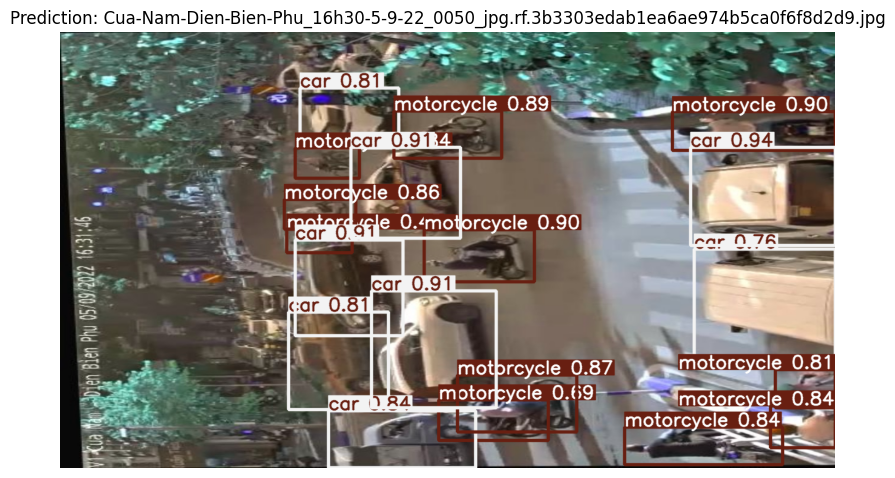

Predicting: Hang-Bong-Hang-Trong_16h30-15-9-22_0024_jpg.rf.8ff99b4a05ab340d650d8c84d2ab8b60.jpg

image 1/1 /content/small_dataset/test/images/Hang-Bong-Hang-Trong_16h30-15-9-22_0024_jpg.rf.8ff99b4a05ab340d650d8c84d2ab8b60.jpg: 576x1024 11 motorcycles, 11.6ms
Speed: 4.1ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)


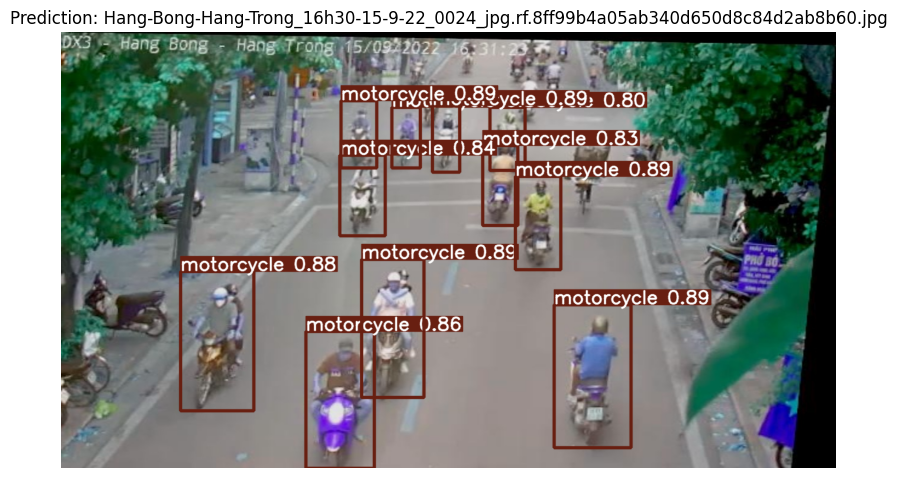

Predicting: Nguyen-Thai-Hoc-Ton-Duc-Thang_16h-25-9-22_0044_jpg.rf.6cc102738cc867f87ba816b7dea2077c.jpg

image 1/1 /content/small_dataset/test/images/Nguyen-Thai-Hoc-Ton-Duc-Thang_16h-25-9-22_0044_jpg.rf.6cc102738cc867f87ba816b7dea2077c.jpg: 576x1024 1 bus, 5 cars, 22 motorcycles, 12.2ms
Speed: 4.6ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 576, 1024)


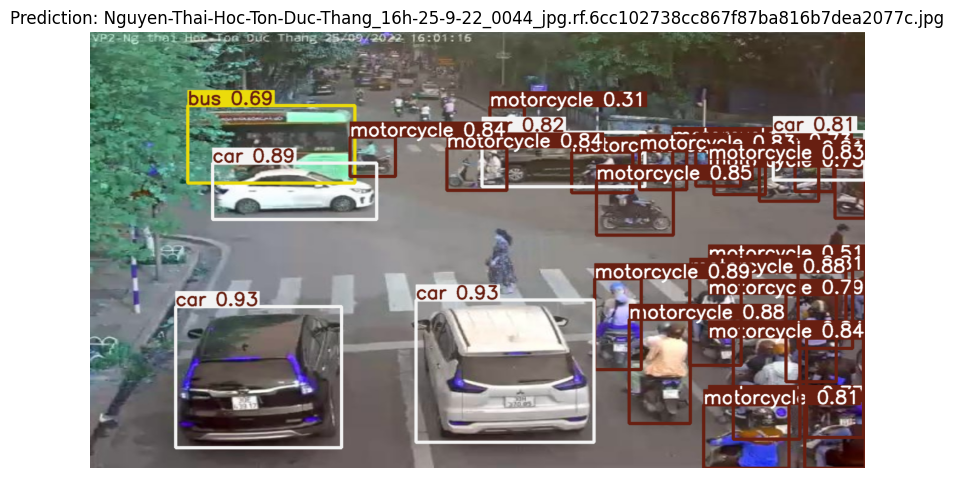

Predicting: Giang-Vo-Lang-Ha_16h-15-9-22_0058_jpg.rf.a25bca425e292fb187f3dfa87e992461.jpg

image 1/1 /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h-15-9-22_0058_jpg.rf.a25bca425e292fb187f3dfa87e992461.jpg: 576x1024 1 bicycle, 1 car, 10 motorcycles, 12.3ms
Speed: 4.1ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)


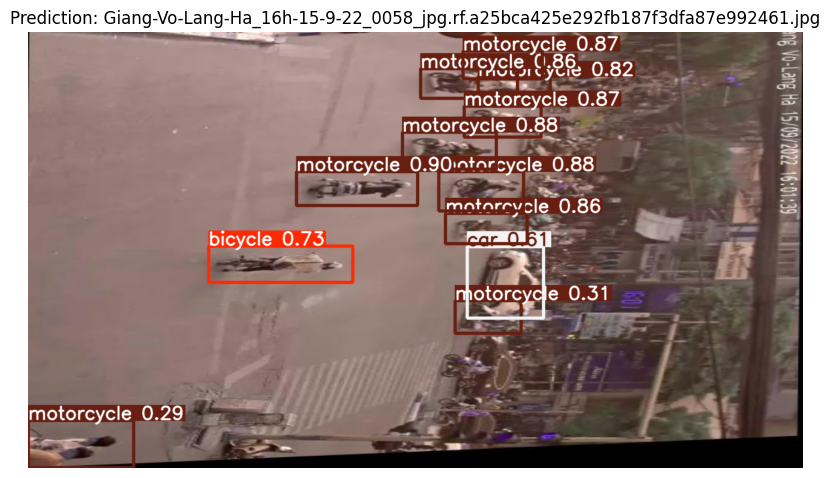

Predicting: Cua-Nam-Dien-Bien-Phu_16h15-5-9-22_0031_jpg.rf.8d9e27b3d13ead0818a3393bb2a2c7f0.jpg

image 1/1 /content/small_dataset/test/images/Cua-Nam-Dien-Bien-Phu_16h15-5-9-22_0031_jpg.rf.8d9e27b3d13ead0818a3393bb2a2c7f0.jpg: 576x1024 5 cars, 18 motorcycles, 14.2ms
Speed: 6.2ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 1024)


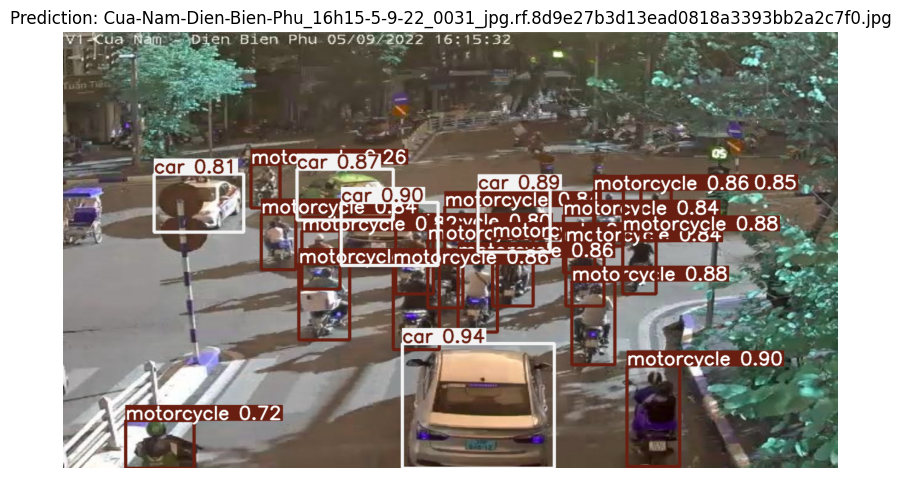

In [58]:
# Path to your dataset images
TEST_IMG_DIR = "/content/small_dataset/test/images"

# Number of random images to visualize the predictions
NUM_IMAGES = 5   # change as needed

# Select random images
img_files = os.listdir(TEST_IMG_DIR)
selected_imgs = random.sample(img_files, NUM_IMAGES)

for img_name in selected_imgs:
    img_path = os.path.join(TEST_IMG_DIR, img_name)
    print("Predicting:", img_name)

    # Run prediction
    results = model.predict(img_path, save=False)

    # Annotated image
    annotated = results[0].plot()

    # Plot
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated)
    plt.title(f"Prediction: {img_name}")
    plt.axis("off")
    plt.show()


Processing: Giang-Vo-Lang-Ha_16h15-15-9-22_0052_jpg.rf.4a47c484bcb49817fb17eb8dfe256d0a.jpg

image 1/1 /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h15-15-9-22_0052_jpg.rf.4a47c484bcb49817fb17eb8dfe256d0a.jpg: 576x1024 5 cars, 25 motorcycles, 11.5ms
Speed: 3.7ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 0
  car: 5
  license-plate: 0
  motorcycle: 25


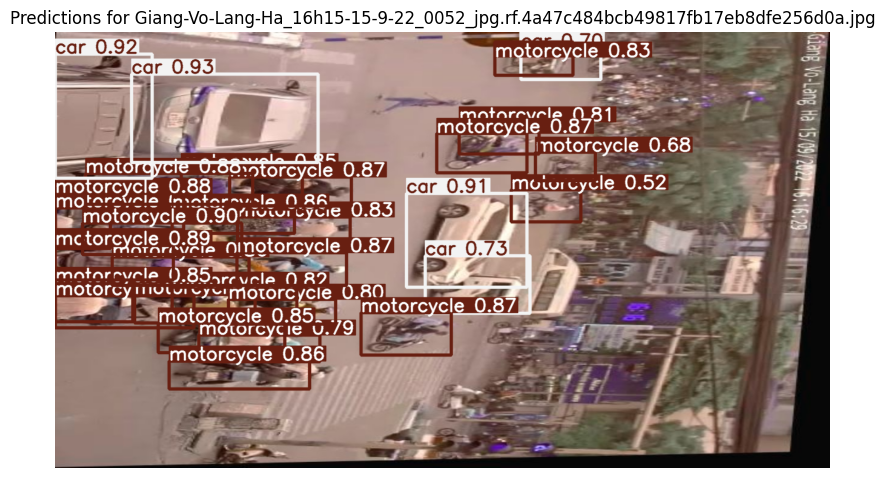


Processing: Giang-Vo-Lang-Ha_16h15-7-9-22_0017_jpg.rf.d543b20f93469ae7f88ce1419640f6fc.jpg

image 1/1 /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h15-7-9-22_0017_jpg.rf.d543b20f93469ae7f88ce1419640f6fc.jpg: 576x1024 3 cars, 14 motorcycles, 11.9ms
Speed: 4.4ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 0
  car: 3
  license-plate: 0
  motorcycle: 14


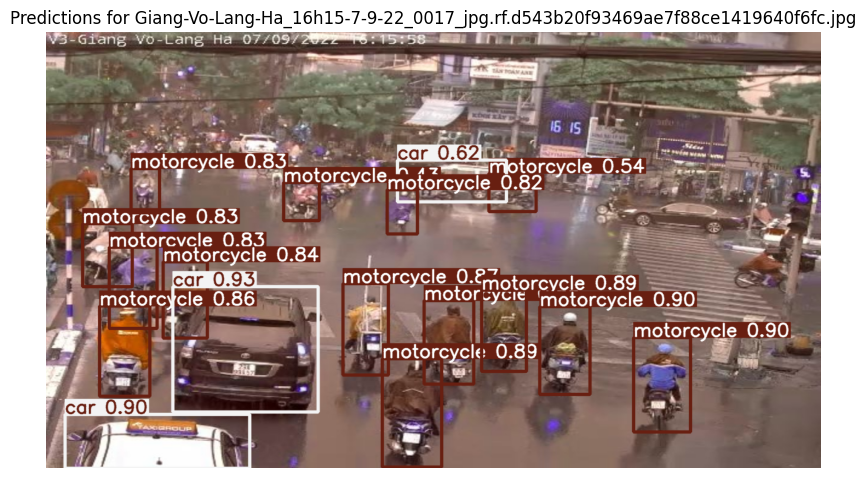


Processing: Dai-Co-Viet-Giai-Phong_7h30-3-9-22_0026_jpg.rf.fd54d1cdbcda73af0077d88893beb5aa.jpg

image 1/1 /content/small_dataset/test/images/Dai-Co-Viet-Giai-Phong_7h30-3-9-22_0026_jpg.rf.fd54d1cdbcda73af0077d88893beb5aa.jpg: 576x1024 6 bicycles, 5 cars, 6 motorcycles, 11.7ms
Speed: 4.2ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 6
  bus: 0
  car: 5
  license-plate: 0
  motorcycle: 6


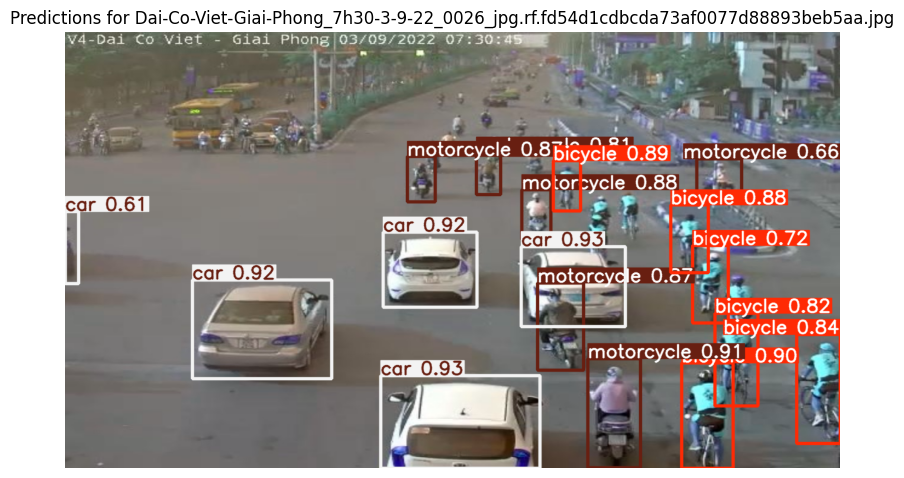


Processing: Hang-Bong-Hang-Trong_16h07-9-22_0053_jpg.rf.9682d64e9c2e1bfeb164925e419e6e2a.jpg

image 1/1 /content/small_dataset/test/images/Hang-Bong-Hang-Trong_16h07-9-22_0053_jpg.rf.9682d64e9c2e1bfeb164925e419e6e2a.jpg: 576x1024 1 bicycle, 3 motorcycles, 14.5ms
Speed: 6.1ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 1
  bus: 0
  car: 0
  license-plate: 0
  motorcycle: 3


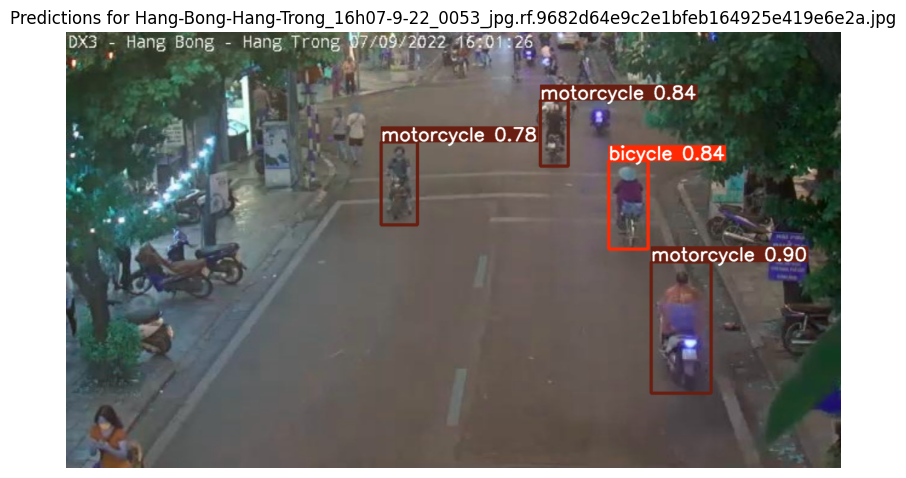


Processing: Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h15-25-9-22_0038_jpg.rf.123239119a8dab25b5470da466f2c6b0.jpg

image 1/1 /content/small_dataset/test/images/Nguyen-Thai-Hoc-Trinh-Hoai-Duc_16h15-25-9-22_0038_jpg.rf.123239119a8dab25b5470da466f2c6b0.jpg: 576x1024 7 motorcycles, 12.2ms
Speed: 5.0ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 0
  car: 0
  license-plate: 0
  motorcycle: 7


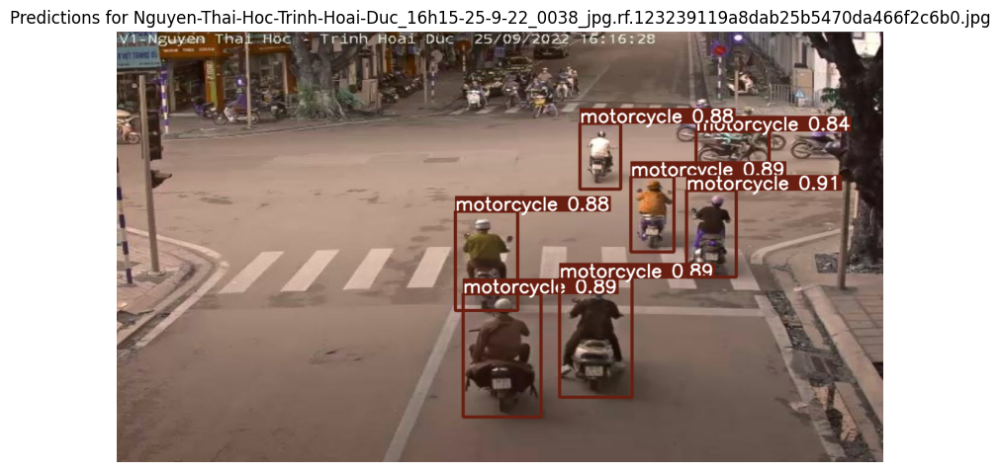

In [59]:
# Load your trained YOLO model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Path to images (test or any folder)
IMG_DIR = "/content/small_dataset/test/images"

# Class names according to your YAML
CLASS_NAMES = ["bicycle", "bus", "car", "license-plate", "motorcycle"]

# Number of random images to test
NUM_IMAGES = 5
img_files = random.sample(os.listdir(IMG_DIR), NUM_IMAGES)

for img_name in img_files:
    img_path = os.path.join(IMG_DIR, img_name)
    print(f"\nProcessing: {img_name}")

    # Run prediction
    results = model(img_path)[0]

    # Count classes
    counts = {name: 0 for name in CLASS_NAMES}
    for box in results.boxes:
        cls = int(box.cls)
        counts[CLASS_NAMES[cls]] += 1

    # Print counts for this image
    print(" Vehicle counts:")
    for cls, cnt in counts.items():
        print(f"  {cls}: {cnt}")

    # Show annotated image
    annotated = results.plot()
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated)
    plt.title(f"Predictions for {img_name}")
    plt.axis("off")
    plt.show()


Processing: Le-Duan-Nguyen-Thai-Hoc_16h15-25-9-22_0025_jpg.rf.3624e0971e0aba2c4673408067735895.jpg

image 1/1 /content/small_dataset/test/images/Le-Duan-Nguyen-Thai-Hoc_16h15-25-9-22_0025_jpg.rf.3624e0971e0aba2c4673408067735895.jpg: 576x1024 1 bus, 5 cars, 4 motorcycles, 11.6ms
Speed: 4.0ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 1
  car: 5
  license-plate: 0
  motorcycle: 4


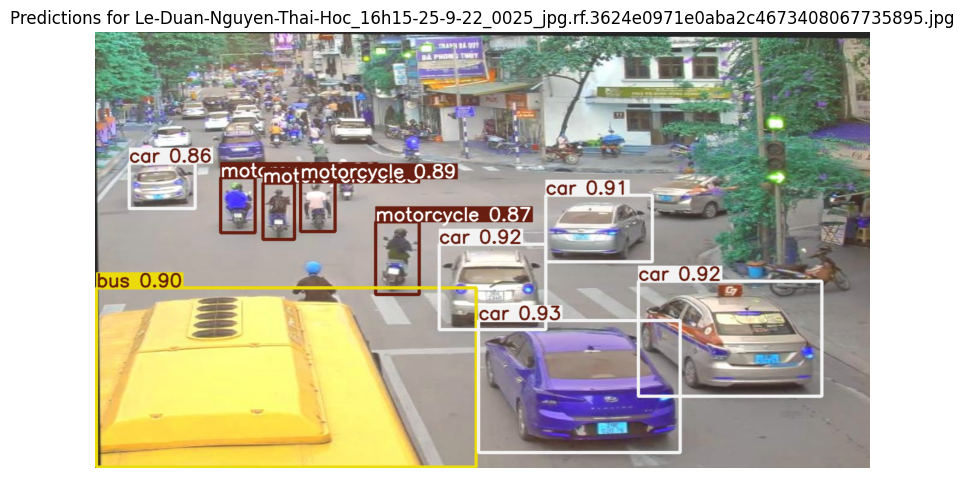


Processing: Giang-Vo-Lang-Ha_16h-7-9-22_0021_jpg.rf.5c659c0612cc99424a61ac1960ec7779.jpg

image 1/1 /content/small_dataset/test/images/Giang-Vo-Lang-Ha_16h-7-9-22_0021_jpg.rf.5c659c0612cc99424a61ac1960ec7779.jpg: 576x1024 1 bicycle, 2 cars, 13 motorcycles, 12.0ms
Speed: 6.1ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 1
  bus: 0
  car: 2
  license-plate: 0
  motorcycle: 13


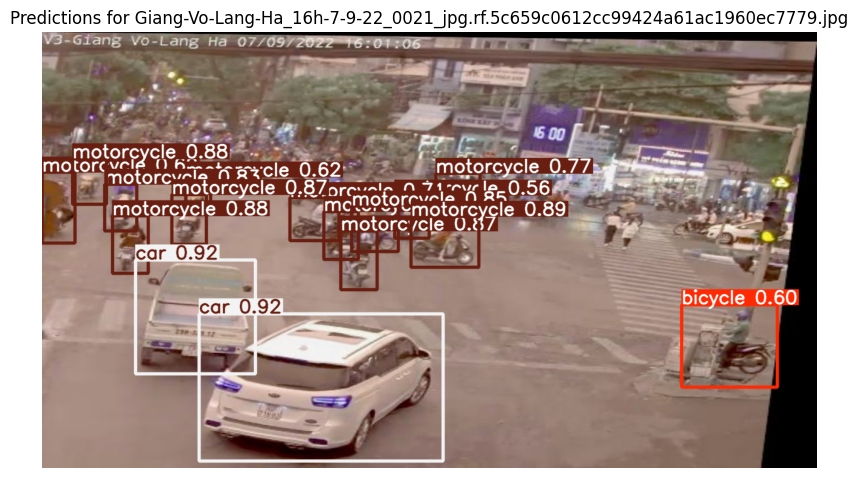


Processing: Ly-Thuong-Kiet-Hang-Bai_16h30-25-9-22_0048_jpg.rf.d0e642532cb6920e89315ef59e7a5b74.jpg

image 1/1 /content/small_dataset/test/images/Ly-Thuong-Kiet-Hang-Bai_16h30-25-9-22_0048_jpg.rf.d0e642532cb6920e89315ef59e7a5b74.jpg: 576x1024 4 cars, 6 motorcycles, 12.1ms
Speed: 4.7ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 0
  car: 4
  license-plate: 0
  motorcycle: 6


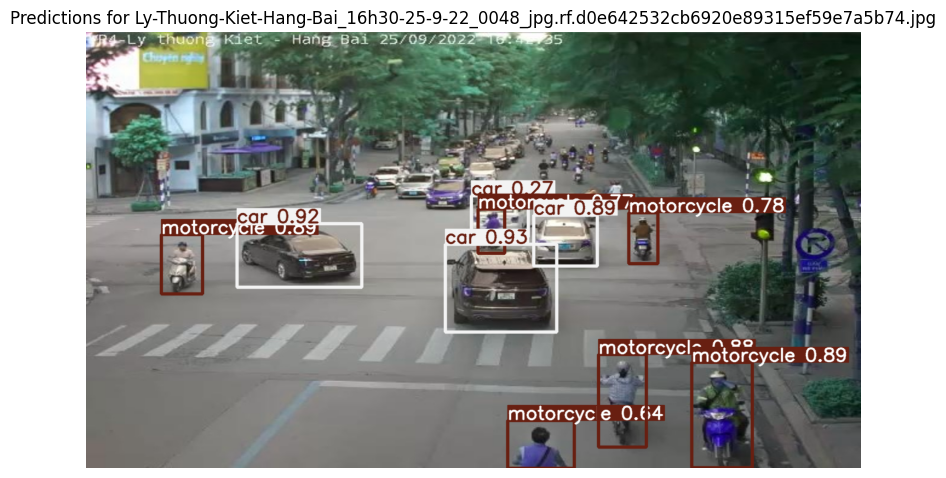


Processing: Ly-Thuong-Kiet-Ba-Trieu_16h30-25-9-22_0027_jpg.rf.d58e2e739afe45c69c59dea49870d2a7.jpg

image 1/1 /content/small_dataset/test/images/Ly-Thuong-Kiet-Ba-Trieu_16h30-25-9-22_0027_jpg.rf.d58e2e739afe45c69c59dea49870d2a7.jpg: 576x1024 1 bicycle, 2 cars, 3 motorcycles, 12.3ms
Speed: 5.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 1
  bus: 0
  car: 2
  license-plate: 0
  motorcycle: 3


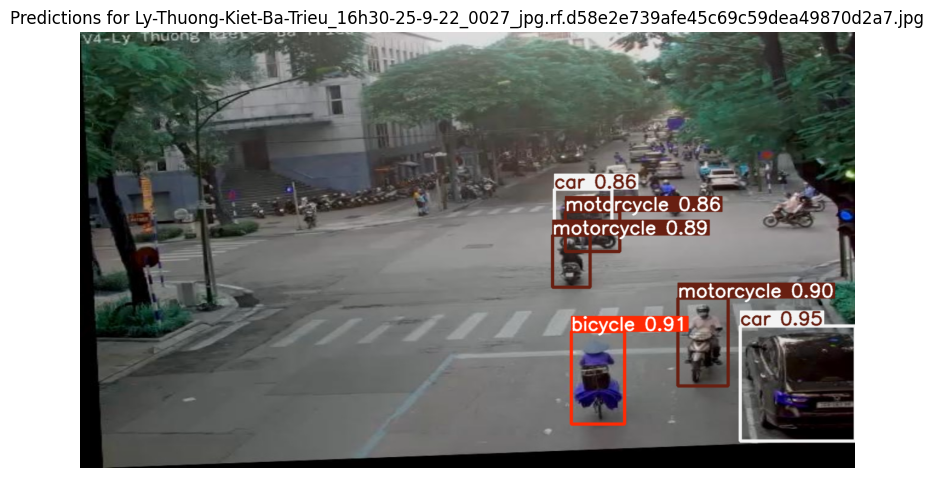


Processing: Dai-Co-Viet-Giai-Phong_7h30-1-9-22_0058_jpg.rf.27682419b1ddfe1fdd6c799dcb969b9a.jpg

image 1/1 /content/small_dataset/test/images/Dai-Co-Viet-Giai-Phong_7h30-1-9-22_0058_jpg.rf.27682419b1ddfe1fdd6c799dcb969b9a.jpg: 576x1024 1 bus, 2 cars, 9 motorcycles, 12.3ms
Speed: 4.3ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 576, 1024)
 Vehicle counts:
  bicycle: 0
  bus: 1
  car: 2
  license-plate: 0
  motorcycle: 9


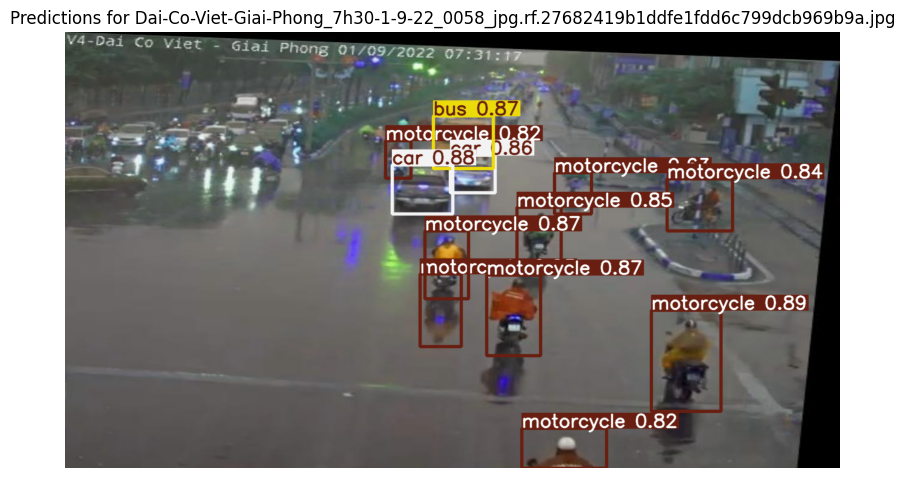

In [60]:
# Load your trained YOLO model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Path to images (test or any folder)
IMG_DIR = "/content/small_dataset/test/images"

# Class names according to your YAML
CLASS_NAMES = ["bicycle", "bus", "car", "license-plate", "motorcycle"]

# Number of random images to test
NUM_IMAGES = 5
img_files = random.sample(os.listdir(IMG_DIR), NUM_IMAGES)

for img_name in img_files:
    img_path = os.path.join(IMG_DIR, img_name)
    print(f"\nProcessing: {img_name}")

    # Run prediction
    results = model(img_path)[0]

    # Count classes
    counts = {name: 0 for name in CLASS_NAMES}
    for box in results.boxes:
        cls = int(box.cls)
        counts[CLASS_NAMES[cls]] += 1

    # Print counts for this image
    print(" Vehicle counts:")
    for cls, cnt in counts.items():
        print(f"  {cls}: {cnt}")

    # Show annotated image
    annotated = results.plot()
    plt.figure(figsize=(10, 10))
    plt.imshow(annotated)
    plt.title(f"Predictions for {img_name}")
    plt.axis("off")
    plt.show()

In [ ]:
import os
import json
from ultralytics import YOLO

# Load trained model
model = YOLO("/content/runs/detect/train/weights/best.pt")

# Test images folder
TEST_IMG_DIR = "/content/small_dataset/test/images"

# Class names
class_names = ["bicycle", "bus", "car", "license-plate", "motorcycle"]

# Dictionary to store results
results_dict = {}

# Loop through all images
for img_file in os.listdir(TEST_IMG_DIR):
    if not img_file.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(TEST_IMG_DIR, img_file)

    # Run inference
    results = model(img_path)[0]

    # Count each class
    counts = {cls: 0 for cls in class_names}
    for box in results.boxes:
        cls_id = int(box.cls)
        counts[class_names[cls_id]] += 1

    # Store counts using actual image filename
    results_dict[img_file] = counts

# Save full results to JSON
output_path = "/content/test_dataset_vehicle_counts.json"
with open(output_path, "w") as f:
    json.dump(results_dict, f, indent=4)

print("Saved:", output_path)